# Credit Card Approval Prediction

**Group 4:** Zhaohui (Emily) Fan, Amber Moon, Hansol Kim

### DATASET

Kaggle Datasource: https://www.kaggle.com/rikdifos/credit-card-approval-prediction

Other Context: https://mp.weixin.qq.com/s/upjzuPg5AMIDsGxlpqnoCg

### Business Context

Credit score cards are a common risk control method in the financial industry. The credit card
data contains personal information and data submitted by credit card applicants that we can use
to predict whether the bank is able to issue a credit card to the applicant. There are two data files
used, the application data and the credit data which includes monthly credit card account status
information.

### Challenges Adressed in Analysis

Explain the business problem clearly you are trying to solve using machine learning and data mining. Remember, you need to approach this as if you were presenting to your boss, a CEO, or a Board of Directors. (Don't afraid to show your technical and communication skills. You need to select relevant business questions to answer)


- **[Exploratory Analysis & Preprocessing](#eda-and-prep)**

- **[Visualization & Descriptive Analysis](#viz)**

- **[Feature Engineering & Final Preprocessing Steps (SMOTE)](#features)**

- **[Logistic Regression](#regression)**

- **[Decision Tree](#trees1)**

- **[Random Forest](#trees2)**

- **[GBM - lightGBM](#gbm)**

- **[XG Boost](#xgboost)**

- **[Summary & Recommendations](#summary-and-recs)**

- **[References & Citations](#references)**


In [1]:
# import libraries and data
%matplotlib inline
%config InlineBackend.figure_format = 'svg'

import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd   
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
import itertools

from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.metrics import accuracy_score, confusion_matrix, plot_confusion_matrix, precision_score, recall_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier, plot_tree

from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn import svm
from sklearn.ensemble import RandomForestClassifier

In [2]:
applications_df = pd.read_csv('application_record.csv')
credit_df = pd.read_csv('credit_record.csv')

In [3]:
# plt.rcParams['figure.facecolor'] = 'white'

<a id="eda-and-prep"></a>
### Exploratory Analysis & Preprocessing

**Primary business question:   which features comprise a potentially risky candidate to extend credit to?**

For the purposes of this assignment, we will assume that a unique id equates to a unique persona to be included in modeling. Therefore, data shaping is based on unique ID's that appear in each dataset.



In [4]:
# For Applications dataset: 
# View shape, nulls, cardinality, duplication (unique count of ID)
applications_df.shape

(438557, 18)

In [5]:
applications_df.isnull().sum()/applications_df.shape[0]

ID                     0.00000
CODE_GENDER            0.00000
FLAG_OWN_CAR           0.00000
FLAG_OWN_REALTY        0.00000
CNT_CHILDREN           0.00000
AMT_INCOME_TOTAL       0.00000
NAME_INCOME_TYPE       0.00000
NAME_EDUCATION_TYPE    0.00000
NAME_FAMILY_STATUS     0.00000
NAME_HOUSING_TYPE      0.00000
DAYS_BIRTH             0.00000
DAYS_EMPLOYED          0.00000
FLAG_MOBIL             0.00000
FLAG_WORK_PHONE        0.00000
FLAG_PHONE             0.00000
FLAG_EMAIL             0.00000
OCCUPATION_TYPE        0.30601
CNT_FAM_MEMBERS        0.00000
dtype: float64

In [6]:
# For Credit Records dataset: 
# View shape, nulls, cardinality, duplication (unique count of ID)
credit_df.shape

(1048575, 3)

In [7]:
credit_df.isnull().sum()

ID                0
MONTHS_BALANCE    0
STATUS            0
dtype: int64

In [8]:
print("Unique ID's in credit records dataset:")
print(credit_df['ID'].nunique())
print('')
print("Unique ID's in applications dataset:")
print(applications_df['ID'].nunique())

Unique ID's in credit records dataset:
45985

Unique ID's in applications dataset:
438510


**Addressing Null Values**

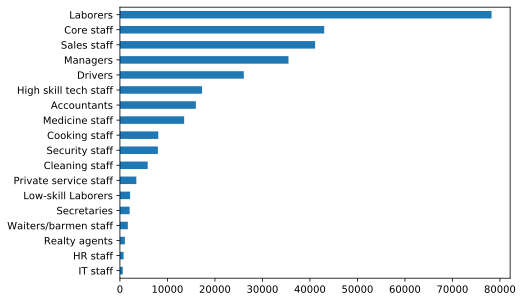

In [9]:
# 30% of Occupation Type column is null
applications_df['OCCUPATION_TYPE'].value_counts().sort_values().plot(kind='barh', figsize=(7,5))

**Because Occupation Type is a categorical variable, some possible options for addressing nulls are:**

1) replace nulls with the mode
2) ignore observations
3) create a new category within variable
4) predict the observation

**However,** since our dataset includes a comparable variable called Income Type, we will drop Occupation Type altogether. 

In [10]:
applications_df.drop('OCCUPATION_TYPE', axis=1, inplace=True)

We also see above that the Credit Records dataset has a long structure with 45,985 unique values in 1,048,575 rows, while the Applications dataset has minimal duplication.

**Therefore, to merge the two into one de-duplicated dataset with our target prediction variable we will:**

1) Identify how many IDs are common to both datasets (36,457)

2) Reshape Credit Records by Grouping by ID

3) Identify IDs where at any point in time there was a balance 60+ days overdue

In [11]:
len(set(applications_df['ID']).intersection(set(credit_df['ID'])))
id_index = list(set(applications_df['ID']).intersection(set(credit_df['ID'])))
applications_df = applications_df[applications_df['ID'].isin(id_index)]
print(applications_df.shape)

(36457, 17)


In [12]:
credit_df['dep_value'] = None
credit_df['dep_value'][credit_df['STATUS'] =='2']='Yes' 
credit_df['dep_value'][credit_df['STATUS'] =='3']='Yes' 
credit_df['dep_value'][credit_df['STATUS'] =='4']='Yes' 
credit_df['dep_value'][credit_df['STATUS'] =='5']='Yes' 

In [13]:
resp=credit_df.groupby('ID').count()
resp['dep_value'][resp['dep_value'] > 0]='Yes' 
resp['dep_value'][resp['dep_value'] == 0]='No' 
resp = resp[['dep_value']]

In [14]:
df=pd.merge(applications_df,resp,how='inner',on='ID')
df['target']=df['dep_value']
df.loc[df['target']=='Yes','target']=1
df.loc[df['target']=='No','target']=0
df.head().T

,0,1,2,3,4
ID,5008804,5008805,5008806,5008808,5008809
CODE_GENDER,M,M,M,F,F
FLAG_OWN_CAR,Y,Y,Y,N,N
FLAG_OWN_REALTY,Y,Y,Y,Y,Y
CNT_CHILDREN,0,0,0,0,0
AMT_INCOME_TOTAL,427500,427500,112500,270000,270000
NAME_INCOME_TYPE,Working,Working,Working,Commercial associate,Commercial associate
NAME_EDUCATION_TYPE,Higher education,Higher education,Secondary / secondary special,Secondary / secondary special,Secondary / secondary special
NAME_FAMILY_STATUS,Civil marriage,Civil marriage,Married,Single / not married,Single / not married
NAME_HOUSING_TYPE,Rented apartment,Rented apartment,House / apartment,House / apartment,House / apartment


In [15]:
#rename columns
df.rename(columns={'CODE_GENDER':'Gender','FLAG_OWN_CAR':'Car','FLAG_OWN_REALTY':'Reality','CNT_CHILDREN':'Children','AMT_INCOME_TOTAL':'income',
'NAME_EDUCATION_TYPE':'education','NAME_HOUSING_TYPE':'housing','FLAG_EMAIL':'email','NAME_INCOME_TYPE':'income_type','CNT_FAM_MEMBERS':'family_size',
},inplace=True)

<a id="viz"></a>
### Visualization & Descriptive Analysis

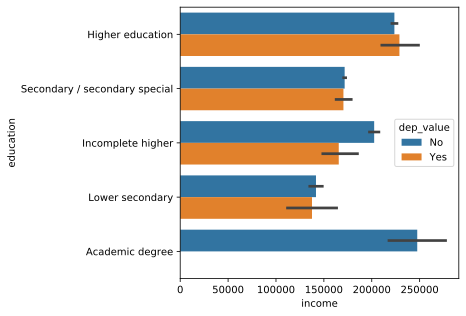

In [16]:
# How do income and education relate to credit status?
plt.figure(figsize=(5,5))
sns.barplot(x="income", y="education", hue="dep_value", data=df)

In [17]:
plt.figure(figsize=(5,5))
sns.stripplot(x="dep_value", y="income", data=df, jitter=True)

<Figure size 360x1080 with 0 Axes>

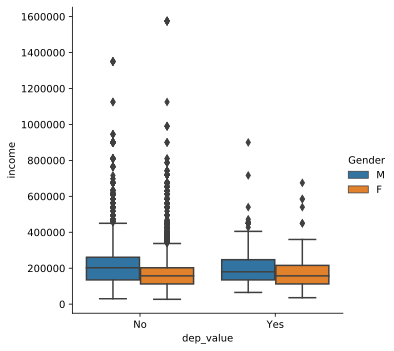

In [18]:
plt.figure(figsize=(5,15))
sns.catplot(x="dep_value", y="income", hue="Gender", kind="box", data=df)

In [19]:
# add column for age in years
df['age'] = df['DAYS_BIRTH']/-365
# add column for years in workforce
df['years_working'] = df['DAYS_EMPLOYED']/-365
# drop columns we aren't going to use
df = df.drop(columns={'ID', 'FLAG_MOBIL', 'FLAG_WORK_PHONE', 'FLAG_PHONE', 'email', 'DAYS_BIRTH', 'DAYS_EMPLOYED', 'NAME_FAMILY_STATUS'})

In [20]:
# create subset risky_df to look for relationships within only "high risk"
# "high risk" = at any point in time had status 60 days or more overdue
risky = ['1']
risky_df = df.loc[df['target'].isin(risky)]

# Within risky subset, where can relationships be identified?
plt.figure(figsize=(10,20))
sns.pairplot(risky_df)

<Figure size 720x1440 with 0 Axes>

<Figure size 720x720 with 0 Axes>

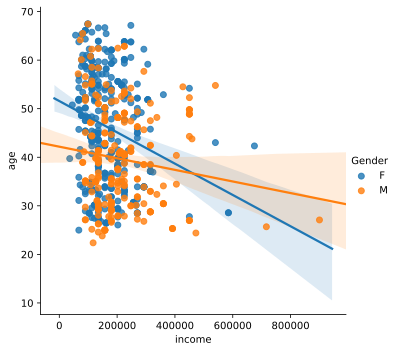

In [21]:
# Within risky subset, what are the relationships between income, age, gender and credit status?
plt.figure(figsize=(10, 10))
sns.lmplot(x="income", y="age", hue="Gender", data=risky_df)

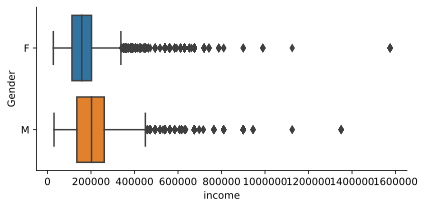

In [22]:
# Income by gender of applicants in dataset
sns.catplot(data=df.sort_values("income"), orient="h", kind="box", x="income", y="Gender", height=3, aspect=2)

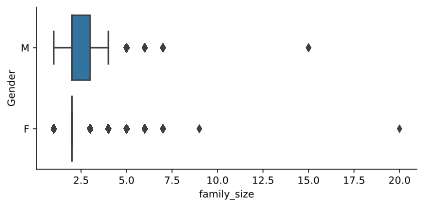

In [23]:
# Family Size by gender of applicants in dataset
sns.catplot(data=df.sort_values("family_size"), orient="h", kind="box", x="family_size", y="Gender", height=3, aspect=2)

In [24]:
# will add a couple more charts that show other features
# prior to submitting project if time
# histograms
# heatmap, etc.

<a id="features"></a>
### Feature Engineering

**Binary Data**

In [25]:
# replace M/F with 0/1
df['Gender'] = df['Gender'].replace(['F','M'],[1,0])
print(df['Gender'].value_counts())
# replace car flag with 0/1
df['Car'] = df['Car'].replace(['N','Y'],[0,1])
print(df['Car'].value_counts())
# replace realty with 0/1
df['Reality'] = df['Reality'].replace(['N','Y'],[0,1])
print(df['Reality'].value_counts())

1    24430
0    12027
Name: Gender, dtype: int64
0    22614
1    13843
Name: Car, dtype: int64
1    24506
0    11951
Name: Reality, dtype: int64


**Categorical Data**

In [26]:
# Convert continuous income to category
df['income'] = pd.cut(df['income'], bins=3, labels=["low", "medium", "high"])
# Convert continuous Children to category
df.loc[df['Children'] >= 2,'Children']='2orMore'
# Convert continuous Family Size to category
df.loc[df['family_size'] >= 3,'family_size']='3orMore'
# Convert continuous Age to category
df['age'] = pd.cut(df['age'], bins=3, labels=["young", "middle_age", "older"])
# Convert continuous Years Working to category
df['years_working'] = pd.cut(df['years_working'], bins=3, labels=["entry", "mid_career", "seasoned"])
df.head(2)

,Gender,Car,Reality,Children,income,income_type,education,housing,family_size,dep_value,target,age,years_working
0,0,1,1,0,low,Working,Higher education,Rented apartment,2,No,0,young,seasoned
1,0,1,1,0,low,Working,Higher education,Rented apartment,2,No,0,young,seasoned


**One Hot Encoding**

In [27]:
# convert all categories to binary
df = pd.get_dummies(df, columns=['income_type',
                                    'education',
                                    'housing',
                                      'income',
                                      'Children',
                                      'family_size',
                                      'age',
                                      'years_working'])
df.head(2)

,Gender,Car,Reality,dep_value,target,income_type_Commercial associate,income_type_Pensioner,income_type_State servant,income_type_Student,income_type_Working,...,Children_2orMore,family_size_1.0,family_size_2.0,family_size_3orMore,age_young,age_middle_age,age_older,years_working_entry,years_working_mid_career,years_working_seasoned
0,0,1,1,No,0,0,0,0,0,1,...,0,0,1,0,1,0,0,0,0,1
1,0,1,1,No,0,0,0,0,0,1,...,0,0,1,0,1,0,0,0,0,1


In [28]:
# rename columns
df = df.drop(columns={'dep_value'})
df.columns = ['Gender','Car','Reality','target','income_type_Commercial','income_type_Pensioner','income_type_State',
              'income_type_Student','income_type_Working','education_degree','education_Higher_ed',
              'education_Incomplete_higher','education_Lower_secondary','education_Secondary','housing_apartment',
              'housing_house','housing_municipal','housing_office_apartment','housing_rented_apartment','housing_parents',
              'income_low','income_medium','income_high','Children_0','Children_1','Children_2orMore','family_size_1',
              'family_size_2','family_size_3orMore','age_young','age_middle','age_older','years_working_entry',
              'years_working_mid_career','years_working_seasoned']

In [29]:
df['income_type_Commercial'] = df.income_type_Commercial.astype('int64')
df['income_type_Pensioner'] = df.income_type_Pensioner.astype('int64')
df['income_type_State'] = df.income_type_State.astype('int64')
df['income_type_Student'] = df.income_type_Student.astype('int64')
df['income_type_Working'] = df.income_type_Working.astype('int64')
df['education_degree'] = df.education_degree.astype('int64')
df['education_Higher_ed'] = df.education_Higher_ed.astype('int64')
df['education_Incomplete_higher'] = df.education_Incomplete_higher.astype('int64')
df['education_Lower_secondary'] = df.education_Lower_secondary.astype('int64')
df['education_Secondary'] = df.education_Secondary.astype('int64')
df['housing_apartment'] = df.housing_apartment.astype('int64')
df['housing_house'] = df.housing_house.astype('int64')
df['housing_municipal'] = df.housing_municipal.astype('int64')
df['housing_office_apartment'] = df.housing_office_apartment.astype('int64')
df['housing_rented_apartment'] = df.housing_rented_apartment.astype('int64')
df['housing_parents'] = df.housing_parents.astype('int64')
df['income_low'] = df.income_low.astype('int64')
df['income_medium'] = df.income_medium.astype('int64')
df['income_high'] = df.income_high.astype('int64')
df['Children_0'] = df.Children_0.astype('int64')
df['Children_1'] = df.Children_1.astype('int64')
df['Children_2orMore'] = df.Children_2orMore.astype('int64')
df['family_size_1'] = df.family_size_1.astype('int64')
df['family_size_2'] = df.family_size_2.astype('int64')
df['family_size_3orMore'] = df.family_size_3orMore.astype('int64')
df['age_young'] = df.age_young.astype('int64')
df['age_middle'] = df.age_middle.astype('int64')
df['age_older'] = df.age_older.astype('int64')
df['years_working_entry'] = df.years_working_entry.astype('int64')
df['years_working_mid_career'] = df.years_working_mid_career.astype('int64')
df['years_working_seasoned'] = df.years_working_seasoned.astype('int64')

**Split data and fix imbalance using SMOTE**

Instructor Comments
1. Why didn't you fix the imbalance problem upfront before applying Decision Forest?
2. Random Forest was full of bias. You can improve this by making the trees have more depth.
3. Why didn't you chose SMOTE as a pre-processing step?
4. When using SMOTE, only apply the synthetic samples to the training data; not testing data.  Balance the training data first with SMOTE and build the model. Measure the performance of the model on test data.

In [30]:
# columns of data we will use to make classifications
X = df.drop('target', axis=1).copy()

# what we want to predict
y = df['target'].copy()

In [31]:
# Checking if the data is imbalanced or not
sum(y)/ len(y)
# 1.69% of the applicants are target users. We need to make sure we maintain the same % across training and testing datasets.
# It's called "stratification": split the data to maintain the ratio. 

0.016896617933455853

In [32]:
# Using Synthetic Minority Over-Sampling Technique(SMOTE) to overcome sample imbalance problem.
X_balance,Y_balance = SMOTE().fit_sample(X,y)
X_balance = pd.DataFrame(X_balance, columns = X.columns)

X_train, X_test, y_train, y_test = train_test_split(X_balance,Y_balance, 
                                                    stratify=Y_balance, test_size=0.3,
                                                    random_state = 1024)

<a id="regression"></a>
### Logistic Regression

In [33]:
logistic_model = LogisticRegression(C=0.8,
                           random_state=0,
                           solver='lbfgs')
logistic_model.fit(X_train, y_train)
y_predict = logistic_model.predict(X_test)

print('Accuracy Score is {:.5}'.format(accuracy_score(y_test, y_predict)))
print(pd.DataFrame(confusion_matrix(y_test,y_predict)))

Accuracy Score is 0.67096
      0     1
0  8498  2254
1  4822  5931


<a id="trees1"></a>
### Decision Tree

In [34]:
print('Accuracy Score is {:.5}'.format(accuracy_score(y_test, y_predict)))
# precision = (TP) / (TP+FP)
print('Precision Score is {:.5}'.format(precision_score(y_test, y_predict)))
# recall = (TP) / (TP+FN)
print('Recall Score is {:.5}'.format(recall_score(y_test, y_predict)))

Accuracy Score is 0.67096
Precision Score is 0.72462
Recall Score is 0.55157


Wall time: 462 ms


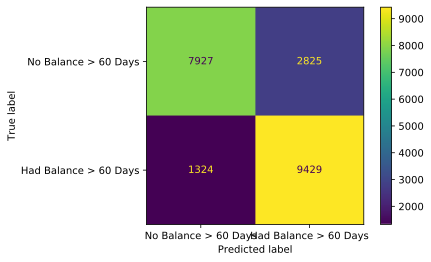

In [35]:
%%time
clf_dt = DecisionTreeClassifier(random_state=1024)
clf_dt = clf_dt.fit(X_train, y_train)
y_predict = clf_dt.predict(X_test)

plot_confusion_matrix(clf_dt, X_test, y_test, display_labels=["No Balance > 60 Days", "Had Balance > 60 Days"])

In [36]:
path = clf_dt.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities
ccp_alphas = ccp_alphas[:-1]

clf_dts = []
for ccp_alpha in ccp_alphas:
    clf_dt = DecisionTreeClassifier(random_state=1024, ccp_alpha=ccp_alpha)
    clf_dt.fit(X_train, y_train)
    clf_dts.append(clf_dt)

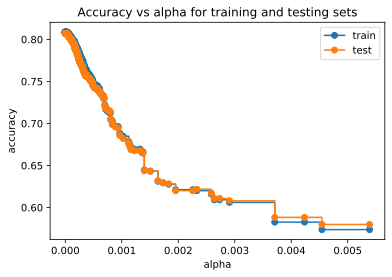

In [37]:
# plot accuracy
train_scores = [clf_dt.score(X_train, y_train) for clf_dt in clf_dts]
test_scores = [clf_dt.score(X_test, y_test) for clf_dt in clf_dts]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker='o', label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker='o', label="test", drawstyle="steps-post")
ax.legend()
plt.show()

Wall time: 7min 22s


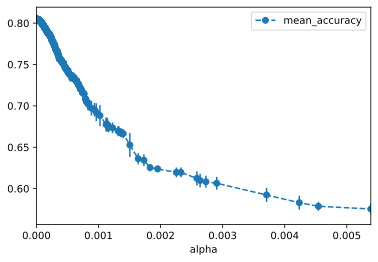

In [38]:
%%time
# use cross validation to find best alpha
alpha_loop_values = []
for ccp_alpha in ccp_alphas:
    clf_dt = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    scores = cross_val_score(clf_dt, X_train, y_train, cv=5)
    alpha_loop_values.append([ccp_alpha, np.mean(scores), np.std(scores)])
    
alpha_results = pd.DataFrame(alpha_loop_values, 
                             columns=['alpha', 'mean_accuracy', 'std'])

alpha_results.plot(x='alpha', 
                   y='mean_accuracy', 
                   yerr='std', 
                   marker='o', 
                   linestyle='--')

In [39]:
# Find exact value
alpha_results[(alpha_results['alpha'] > 0.000)
             &
             (alpha_results['alpha'] < 0.001)]

,alpha,mean_accuracy,std
1,9.013772e-09,0.804691,0.002645
2,9.581466e-09,0.804691,0.002645
3,1.830789e-08,0.804691,0.002645
4,2.787336e-08,0.804691,0.002645
5,3.874768e-08,0.804691,0.002645
...,...,...,...
499,8.309203e-04,0.702932,0.007369
500,8.326528e-04,0.702393,0.007769
501,8.857058e-04,0.697311,0.008946
502,9.361669e-04,0.695398,0.008323


In [40]:
# Store ideal value for alpha
ideal_ccp_alpha = 0.001

In [41]:
%%time
clf_dt_pruned = DecisionTreeClassifier(random_state=1024, 
                                       ccp_alpha=ideal_ccp_alpha)
clf_dt_pruned = clf_dt_pruned.fit(X_train, y_train) 
y_predict_pruned = clf_dt_pruned.predict(X_test)

print(pd.DataFrame(confusion_matrix(y_test,y_predict_pruned)))

      0     1
0  6144  4608
1  2150  8603
Wall time: 283 ms


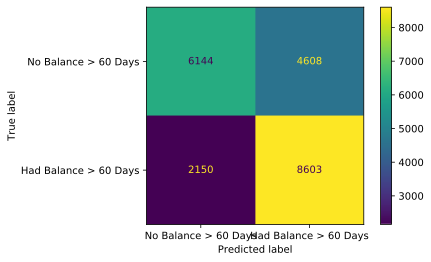

In [42]:
# confusion matrix
plot_confusion_matrix(clf_dt_pruned, 
                      X_test, 
                      y_test, 
                      display_labels=["No Balance > 60 Days", "Had Balance > 60 Days"])

In [43]:
print('Accuracy Score is {:.5}'.format(accuracy_score(y_test, y_predict)))
# precision = (TP) / (TP+FP)
print('Precision Score is {:.5}'.format(precision_score(y_test, y_predict)))
# recall = (TP) / (TP+FN)
print('Recall Score is {:.5}'.format(recall_score(y_test, y_predict)))

Accuracy Score is 0.80707
Precision Score is 0.76946
Recall Score is 0.87687


[Text(821.5399484536083, 1310.4642857142858, 'Reality <= 0.5\ngini = 0.5\nsamples = 50177\nvalue = [25089, 25088]\nclass = No Overdue'),
 Text(528.5180412371134, 1213.392857142857, 'Gender <= 0.5\ngini = 0.483\nsamples = 20238\nvalue = [8270, 11968]\nclass = Yes Overdue'),
 Text(294.819587628866, 1116.3214285714287, 'family_size_2 <= 0.5\ngini = 0.436\nsamples = 9347\nvalue = [2995, 6352]\nclass = Yes Overdue'),
 Text(186.95876288659795, 1019.25, 'housing_parents <= 0.5\ngini = 0.378\nsamples = 5689\nvalue = [1438, 4251]\nclass = Yes Overdue'),
 Text(158.1958762886598, 922.1785714285714, 'Car <= 0.5\ngini = 0.35\nsamples = 5405\nvalue = [1220, 4185]\nclass = Yes Overdue'),
 Text(57.52577319587629, 825.1071428571429, 'Children_2orMore <= 0.5\ngini = 0.281\nsamples = 3004\nvalue = [508, 2496]\nclass = Yes Overdue'),
 Text(28.762886597938145, 728.0357142857143, 'gini = 0.243\nsamples = 2771\nvalue = [393, 2378]\nclass = Yes Overdue'),
 Text(86.28865979381443, 728.0357142857143, 'age_young

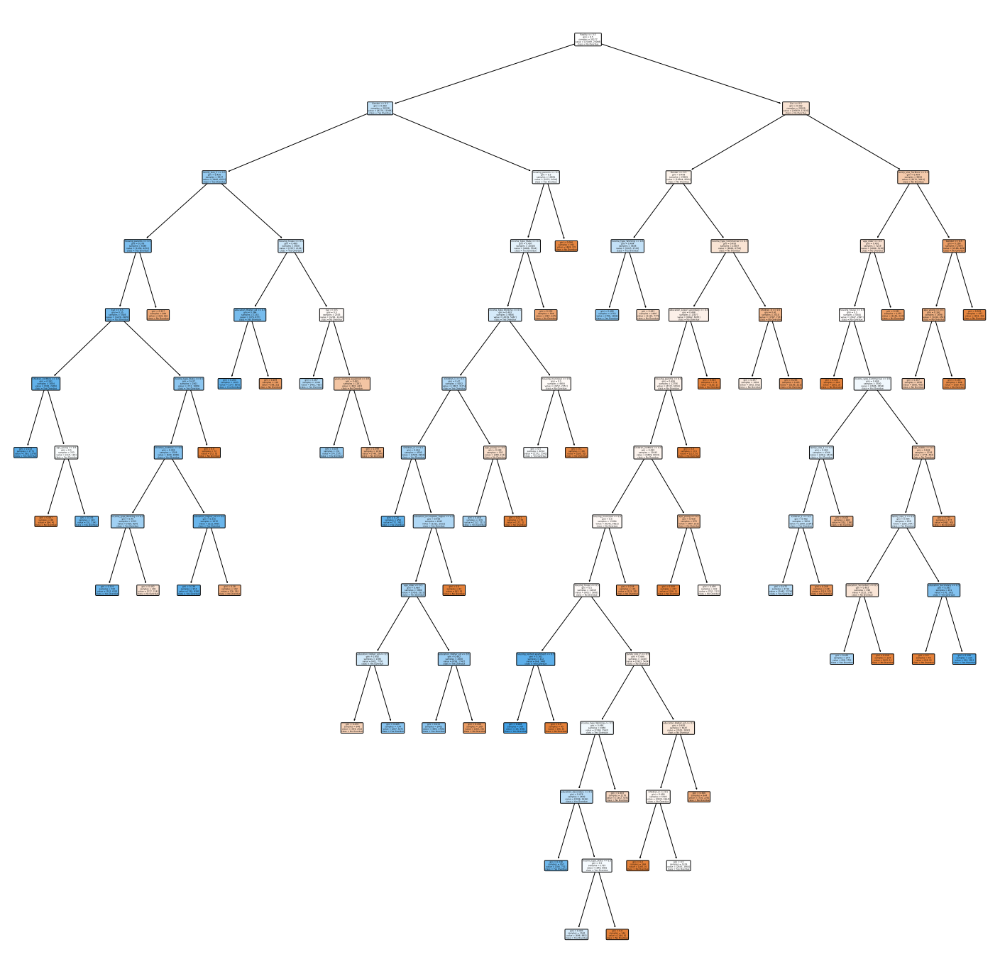

In [44]:
# Draw Decision Tree
plt.figure(figsize=(25,25))
plot_tree(clf_dt_pruned, 
           filled=True, 
         rounded=True, 
          class_names=["No Overdue", "Yes Overdue"], 
          feature_names=X.columns) 

<a id="trees2"></a>
### Random Forest

In [45]:
%%time
clf_rf = RandomForestClassifier(n_estimators=250,
                              max_depth=50,
                              min_samples_leaf=16
                              )
clf_rf.fit(X_train, y_train)
y_predict = clf_rf.predict(X_test)

print(pd.DataFrame(confusion_matrix(y_test,y_predict)))

      0     1
0  8228  2524
1  2109  8644
Wall time: 11 s


In [46]:
print('Accuracy Score is {:.5}'.format(accuracy_score(y_test, y_predict)))
# precision = (TP) / (TP+FP)
print('Precision Score is {:.5}'.format(precision_score(y_test, y_predict)))
# recall = (TP) / (TP+FN)
print('Recall Score is {:.5}'.format(recall_score(y_test, y_predict)))

Accuracy Score is 0.78456
Precision Score is 0.774
Recall Score is 0.80387


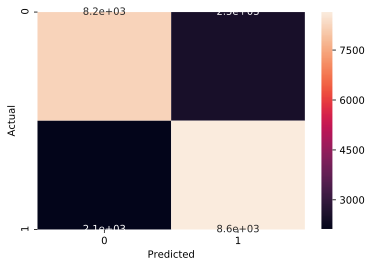

In [47]:
clf_rf_matrix = pd.crosstab(y_test, y_predict, rownames=['Actual'], colnames=['Predicted'])
sns.heatmap(clf_rf_matrix, annot=True)

<a id="gbm"></a>
### GBM —— lightGBM

In [48]:
%%time
from lightgbm import LGBMClassifier
clf_gbm = LGBMClassifier(num_leaves=35,
                       max_depth=8, 
                       learning_rate=0.02,
                       n_estimators=250,
                       subsample = 0.8,
                       colsample_bytree =0.8
                      )
clf_gbm.fit(X_train, y_train)
y_predict = clf_gbm.predict(X_test)

print(pd.DataFrame(confusion_matrix(y_test,y_predict)))

      0     1
0  8249  2503
1  2193  8560
Wall time: 1.96 s


In [49]:
print('Accuracy Score is {:.5}'.format(accuracy_score(y_test, y_predict)))
# precision = (TP) / (TP+FP)
print('Precision Score is {:.5}'.format(precision_score(y_test, y_predict)))
# recall = (TP) / (TP+FN)
print('Recall Score is {:.5}'.format(recall_score(y_test, y_predict)))

Accuracy Score is 0.78163
Precision Score is 0.77375
Recall Score is 0.79606


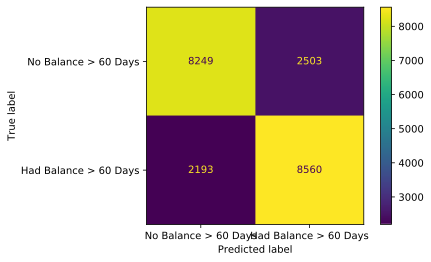

In [50]:
# Confusion Matrix on the test data
plot_confusion_matrix(clf_gbm,
                      X_test,
                      y_test,
                      values_format='d',
                      display_labels=["No Balance > 60 Days", "Had Balance > 60 Days"])

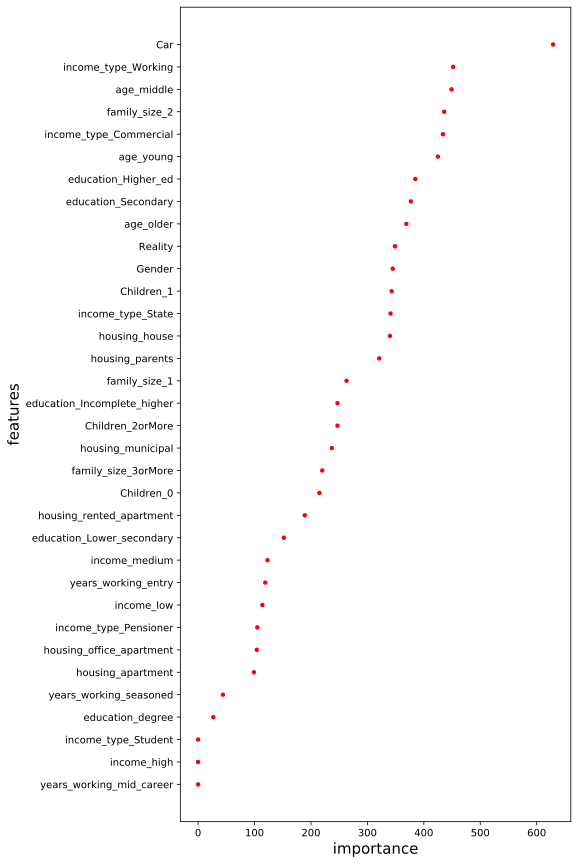

In [51]:
#Showing important features:

def plot_importance(classifer, x_train, point_size = 25):
    #plot feature importance
    values = sorted(zip(x_train.columns, classifer.feature_importances_), key = lambda x: x[1] * -1)
    imp = pd.DataFrame(values,columns = ["Name", "Score"])
    imp.sort_values(by = 'Score',inplace = True)
    b = sns.scatterplot(x = 'Score',y='Name', linewidth = 0,
                data = imp,s = point_size, color='red')
    fig = plt.gcf()
    fig.set_size_inches(7, 15) # Change plot size
    b.set_xlabel("importance",fontsize=15)
    b.set_ylabel("features",fontsize=15)
    b.tick_params(labelsize=10)

plot_importance(clf_gbm, X_train,20)   

<a id="xgboost"></a>
### XG Boost

In [52]:
%%time
import xgboost as xgb

# Creating the XGBClassfier shell
clf_xgb = xgb.XGBClassifier(objective='binary:logistic', missing=None, seed=42)

'''
Instead of finding the optimal number of tress using K-Cross Validation, 
we use early stopping to stop the tree when the cost function no longer reduces.
XGBoost will do the cross validation; we just have to specifiy the 
number of rounds to exhaust with no improvement before stopping.
We use evaluation metric as Area Under Precision-Recall Curve
'''

clf_xgb.fit(X_train,
            y_train,
            verbose=True,
            early_stopping_rounds=10,
            eval_metric='aucpr',
            eval_set=[(X_test, y_test)])

# After building 99 trees, the model doesn't improve any longer. base_score=0.5
# So we check for the next 10 iterations and stop.

# make predictions for test data
y_predict = clf_xgb.predict(X_test)

# evaluate predictions
print(pd.DataFrame(confusion_matrix(y_test,y_predict)))

[0]	validation_0-aucpr:0.71119
Will train until validation_0-aucpr hasn't improved in 10 rounds.
[1]	validation_0-aucpr:0.73931
[2]	validation_0-aucpr:0.74282
[3]	validation_0-aucpr:0.75117
[4]	validation_0-aucpr:0.77929
[5]	validation_0-aucpr:0.79749
[6]	validation_0-aucpr:0.79765
[7]	validation_0-aucpr:0.80819
[8]	validation_0-aucpr:0.80953
[9]	validation_0-aucpr:0.82485
[10]	validation_0-aucpr:0.83162
[11]	validation_0-aucpr:0.83285
[12]	validation_0-aucpr:0.83837
[13]	validation_0-aucpr:0.85190
[14]	validation_0-aucpr:0.85362
[15]	validation_0-aucpr:0.85955
[16]	validation_0-aucpr:0.86464
[17]	validation_0-aucpr:0.86978
[18]	validation_0-aucpr:0.87440
[19]	validation_0-aucpr:0.87473
[20]	validation_0-aucpr:0.87534
[21]	validation_0-aucpr:0.87771
[22]	validation_0-aucpr:0.87765
[23]	validation_0-aucpr:0.87755
[24]	validation_0-aucpr:0.87752
[25]	validation_0-aucpr:0.87938
[26]	validation_0-aucpr:0.88383
[27]	validation_0-aucpr:0.88515
[28]	validation_0-aucpr:0.88606
[29]	validation_

In [53]:
print('Accuracy Score is {:.5}'.format(accuracy_score(y_test, y_predict)))
# precision = (TP) / (TP+FP)
print('Precision Score is {:.5}'.format(precision_score(y_test, y_predict)))
# recall = (TP) / (TP+FN)
print('Recall Score is {:.5}'.format(recall_score(y_test, y_predict)))

Accuracy Score is 0.80451
Precision Score is 0.77598
Recall Score is 0.85623


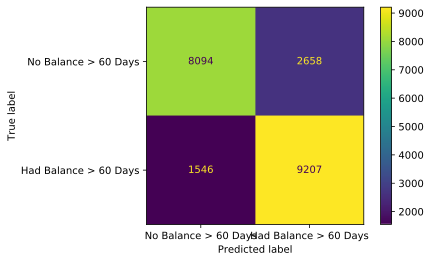

In [54]:
# Confusion Matrix on the test data
plot_confusion_matrix(clf_xgb,
                      X_test,
                      y_test,
                      values_format='d',
                      display_labels=["No Balance > 60 Days", "Had Balance > 60 Days"])

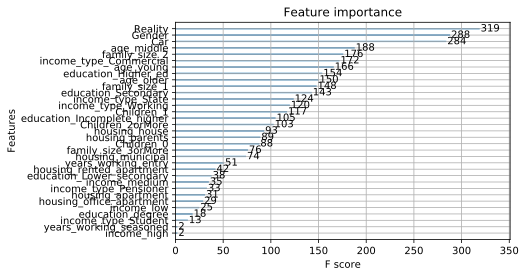

In [ ]:
xgb.plot_importance(clf_xgb)
plt.rcParams['figure.figsize'] = [10, 15]
plt.show()

In [ ]:
## graphviz got issue with my laptop's system and unavilable for a while.
## to prevent more time consumption, will leave this graph out of the project for now
from xgboost import plot_tree
from graphviz import Digraph

# Draw XGBoost Tree
fig = plt.figure(figsize=(10, 10))
ax = fig.subplots()
xgb.plot_tree(clf_xgb, num_trees=20, ax=ax)
plt.show()

# CalledProcessError: Command '['dot', '-Tpng']' returned non-zero exit status 4294967295

<a id="summary-and-recs"></a>
### Summary and Recommendations

<a id="references"></a>
### References & Citations

1) Ways To Handle Categorical Column Missing Data & Its Implementations. https://medium.com/analytics-vidhya/ways-to-handle-categorical-column-missing-data-its-implementations-15dc4a56893


